# BERTopic modeling for NYT OPEC articles

### 1. Fit the BERTopic model to the docs

In [62]:
import pandas as pd
import numpy as np
from bertopic import BERTopic
import matplotlib.pyplot as plt
from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity
from BERTopicTools.CosineSimilarityTools import CosineSimilarityTools
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
from umap import UMAP
import pickle

In [47]:
from IPython.display import display, HTML

# Disable the scrolling
display(HTML("<style>.output_scroll { height: auto !important; }</style>"))

In [2]:
df = pd.read_csv("nyt_articles.csv")

In [3]:
df['doc'] = df['abstract'].fillna('') + df['snippet'].fillna('') + df['lead_paragraph'].fillna('')

In [4]:
docs = df['doc'].tolist()

In [66]:
# topic_model = BERTopic(language="english",calculate_probabilities=True,verbose=True)

# topics, probs = topic_model.fit_transform(docs)

# # Save the model to a file
# with open('topic_model.pkl', 'wb') as file:
#     pickle.dump(topic_model, file)

In [67]:
# Load the model from the file
with open('topic_model.pkl', 'rb') as file:
    topic_model = pickle.load(file)

In [68]:
hierarchical_topics = topic_model.hierarchical_topics(docs)

100%|██████████████████████████████████████████| 28/28 [00:00<00:00, 377.94it/s]


In [69]:
# topic_model.hierarchical_topics(docs).to_csv("hello.csv")

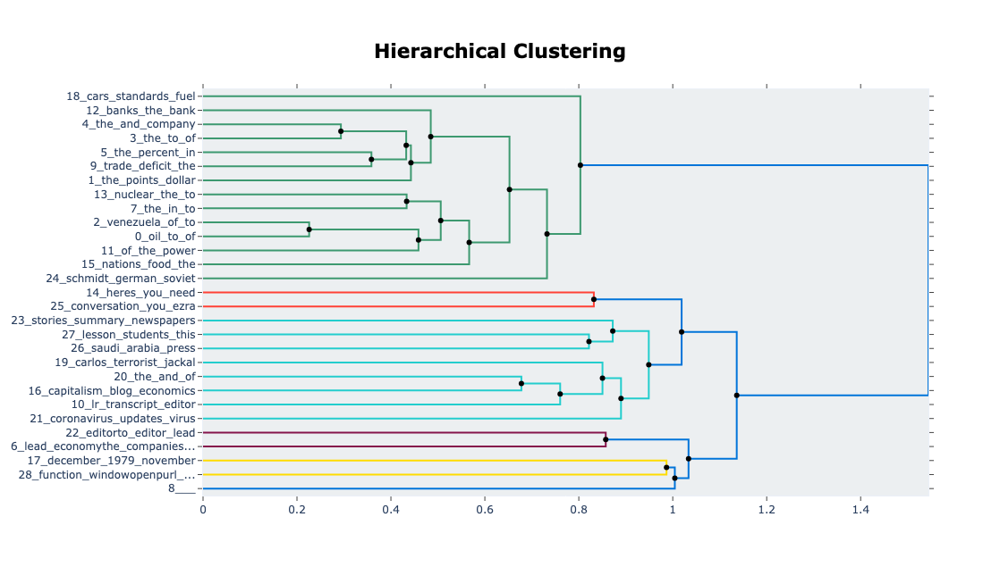

In [70]:
topic_model.visualize_hierarchy(hierarchical_topics = hierarchical_topics)

In [49]:
tree = topic_model.get_topic_tree(hierarchical_topics)
print(tree)

.
├─oil_production_opec_saudi_petroleum
│    ├─oil_venezuela_price_saudi_opec
│    │    ├─saudi_yamani_sheik_zaki_ahmed
│    │    │    ├─saudi_arabia_kingdom_saudis_g7
│    │    │    │    ├─■──saudi_arabia_press_saud_ratcheted ── Topic: 124
│    │    │    │    └─■──g7_saudi_reason_arabia_saudis ── Topic: 125
│    │    │    └─saudi_yamani_sheik_zaki_ahmed
│    │    │         ├─saudi_yamani_sheik_zaki_ahmed
│    │    │         │    ├─■──saudi_arabian_arabia_increase_price ── Topic: 18
│    │    │         │    └─■──yamani_sheik_zaki_ahmed_minister ── Topic: 10
│    │    │         └─■──saudi_price_34_members_barrel ── Topic: 135
│    │    └─venezuela_oil_price_hugo_of
│    │         ├─libya_cos_embargo_libyan_participation
│    │         │    ├─libya_embargo_libyan_muammar_arab
│    │         │    │    ├─■──libya_libyan_muammar_elqaddafi_libyas ── Topic: 32
│    │         │    │    └─■──embargo_arab_israeli_us_reptdly ── Topic: 54
│    │         │    └─■──cos_participation_concessions_west

In [50]:
# Further reduce topics
topic_model.reduce_topics(docs, nr_topics=30)

# Access updated topics
topics = topic_model.topics_

2023-12-08 13:51:15,358 - BERTopic - Reduced number of topics from 148 to 30


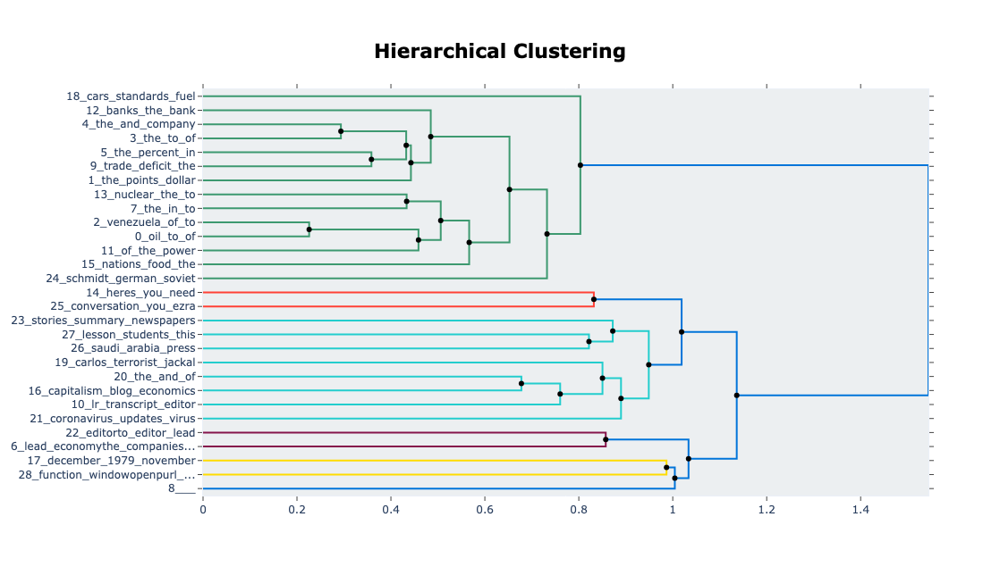

In [51]:
topic_model.visualize_hierarchy(hierarchical_topics = hierarchical_topics)

In [53]:
new_topic_info = topic_model.get_topic_info()
new_topic_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,4292,-1_the_of_to_in,"[the, of, to, in, and, oil, that, for, on, pri...",[GEOGRAPHY Location: western Europe. Boundarie...
1,0,2820,0_oil_to_of_the,"[oil, to, of, the, in, and, prices, that, on, ...","[ OPEC oil ministers left for home tonight, h..."
2,1,386,1_the_points_dollar_in,"[the, points, dollar, in, stock, trading, dow,...",[ Prices rose sharply and interest rates fell...
3,2,371,2_venezuela_of_to_oil,"[venezuela, of, to, oil, hugo, in, and, the, v...","[OPEC ministers, meeting in Caracas, Venezuela..."
4,3,230,3_the_to_of_for,"[the, to, of, for, and, in, its, companies, th...",[LEAD: COMPANIES Philip Morris offered $11.5...
5,4,218,4_the_and_company_exxon,"[the, and, company, exxon, oil, of, in, earnin...",[ Continuing the trend of lackluster earnings...
6,5,211,5_the_percent_in_inflation,"[the, percent, in, inflation, of, to, economy,...",[ The Economy House Democrats began workin...
7,6,183,6_lead_economythe_companiescompanies_economy,"[lead, economythe, companiescompanies, economy...","[LEAD: The EconomyThe Economy, LEAD: The Econ..."
8,7,155,7_the_in_to_of,"[the, in, to, of, and, a1, for, on, new, at]",[ INTERNATIONAL A3-8 China Leader Backs A...
9,8,127,8____,"[, , , , , , , , , ]","[, , ]"


In [58]:
sentence_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = sentence_model.encode(docs, show_progress_bar=False)

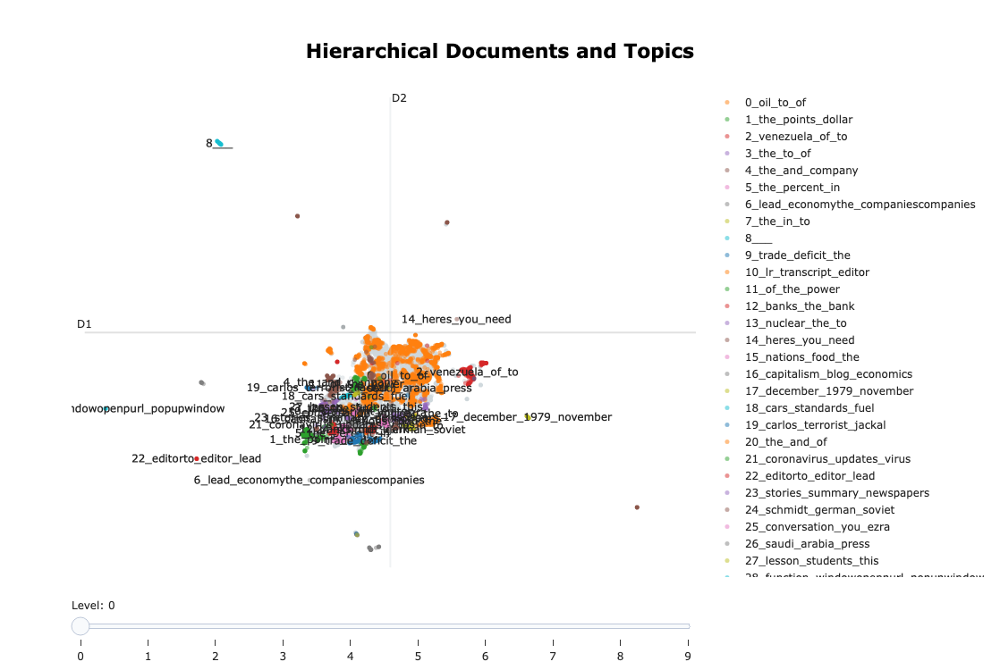

In [60]:
# Run the visualization with the original embeddings
topic_model.visualize_hierarchical_documents(docs, hierarchical_topics, embeddings=embeddings)

# Reduce dimensionality of embeddings, this step is optional but much faster to perform iteratively:
# reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)
# topic_model.visualize_hierarchical_documents(docs, hierarchical_topics, reduced_embeddings=reduced_embeddings)


### 2. Map the topics to the original dataframe

In [25]:
topic_info = topic_model.get_topic_info()
topic_info

,Topic,Count,Name,Representation,Representative_Docs
0,-1,4292,-1_the_of_and_to,"[the, of, and, to, in, oil, that, prices, for,...",[LEAD: THE ECONOMY The index of leading indi...
1,0,253,0_venezuela_hugo_venezuelan_chavez,"[venezuela, hugo, venezuelan, chavez, caracas,...",[Venezuela may be increasing tension in energy...
2,1,241,1_russia_russian_russias_soviet,"[russia, russian, russias, soviet, vladimir, m...",[Pres Bush and Russian Pres Vladimir V Putin a...
3,2,175,2_billion_d1_company_companies,"[billion, d1, company, companies, bid, buy, de...",[ OFFER FOR KINDER MORGAN -- A group led by Ri...
4,3,159,3_energy_us_crisis_imports,"[energy, us, crisis, imports, embargo, is, sta...",[Article asks why US should do anything about ...
...,...,...,...,...,...
143,142,11,142_trout_futures_bull_manages,"[trout, futures, bull, manages, crane, market,...","[WHILE still in his 20's, Monroe Trout Jr. was..."
144,143,10,143_fischer_joschka_klein_comrade,"[fischer, joschka, klein, comrade, hansjoachim...","[Joschka Fischer, German foreign minister, apo..."
145,144,10,144_below_yesterday_barrel_mercantile,"[below, yesterday, barrel, mercantile, slumped...",[LEAD: Crude oil prices fell decisively below ...
146,145,10,145_stem_cut_production_consensus,"[stem, cut, production, consensus, decline, re...",[OPEC may be considering cutting its productio...


In [8]:
# Get topic information
topic_info = topic_model.get_topic_info()

# Create a dictionary for Topic Name and Representation mapping
topic_name_mapping = dict(zip(topic_info['Topic'], topic_info['Name']))
topic_representation_mapping = dict(zip(topic_info['Topic'], topic_info['Representation']))

# Add the topic numbers to your original DataFrame
df['Topic'] = topics

# Map the topic names and representations
df['Topic Name'] = df['Topic'].map(topic_name_mapping)
df['Topic Representation'] = df['Topic'].map(topic_representation_mapping)

# Convert 'pub_date' to datetime
df['pub_date'] = pd.to_datetime(df['pub_date'])

# Extract the year
df['year'] = df['pub_date'].dt.year

# Extract the year and month (in datetime format)
df['year_month'] = df['pub_date'].dt.to_period('M')

In [9]:
df.head(3)

,Unnamed: 0.1,Unnamed: 0,abstract,web_url,snippet,lead_paragraph,print_section,print_page,pub_date,_id,word_count,uri,doc,Topic,Topic Name,Topic Representation,year,year_month
0,0,0,Petroleum Exporting Countries Orgn (OPEC) conf...,https://www.nytimes.com/1961/02/15/archives/wo...,Petroleum Exporting Countries Orgn (OPEC) conf...,NaN,business financial,49.0,1961-02-15 05:00:00+00:00,nyt://article/6cd91ec1-77f8-52a5-b7ee-9937a6ec...,0,nyt://article/6cd91ec1-77f8-52a5-b7ee-9937a6ec...,Petroleum Exporting Countries Orgn (OPEC) conf...,0,0_venezuela_hugo_venezuelan_chavez,"[venezuela, hugo, venezuelan, chavez, caracas,...",1961,1961-02
1,1,1,Min Perez Alfonzo (Venezuela) on way to USSR t...,https://www.nytimes.com/1961/07/29/archives/be...,Min Perez Alfonzo (Venezuela) on way to USSR t...,NaN,BUSINESS FINANCIAL,23.0,1961-07-29 05:00:00+00:00,nyt://article/8abf4ee1-8531-5bbf-9bee-6588ccc0...,0,nyt://article/8abf4ee1-8531-5bbf-9bee-6588ccc0...,Min Perez Alfonzo (Venezuela) on way to USSR t...,0,0_venezuela_hugo_venezuelan_chavez,"[venezuela, hugo, venezuelan, chavez, caracas,...",1961,1961-07
2,2,2,Venezuela backs Iraqi plea to postpone OPEC co...,https://www.nytimes.com/1961/08/08/archives/ca...,Venezuela backs Iraqi plea to postpone OPEC co...,NaN,BUSINESS FINANCIAL,40.0,1961-08-08 05:00:00+00:00,nyt://article/7bbaaae0-3ae6-5c52-851a-f10d8e5e...,0,nyt://article/7bbaaae0-3ae6-5c52-851a-f10d8e5e...,Venezuela backs Iraqi plea to postpone OPEC co...,0,0_venezuela_hugo_venezuelan_chavez,"[venezuela, hugo, venezuelan, chavez, caracas,...",1961,1961-08


### 3. Compute the entropy for each topic and plot the histogram

#### 3.1. Group by year

In [10]:
def entropy(probs):
    return -np.sum([p * np.log2(p) for p in probs if p > 0])

In [11]:
# Step 1: Count the occurrences of each topic in each year
topic_year_counts = df.groupby(['Topic', 'year']).size().reset_index(name='count')

# Step 2: Calculate the total counts of each topic across all years
total_counts = topic_year_counts.groupby('Topic')['count'].sum()

# Step 3: Merge total counts back to the topic-year counts DataFrame
topic_year_counts = topic_year_counts.merge(total_counts, on='Topic', suffixes=('', '_total'))

# Step 4: Calculate the probability distribution of each topic over the years
topic_year_counts['probability'] = topic_year_counts['count'] / topic_year_counts['count_total']

# Step 5: Calculate the entropy for each topic
topic_entropy = topic_year_counts.groupby('Topic')['probability'].apply(entropy).reset_index(name='entropy')

# Step 6: Create a mapping DataFrame from df
for column in ['Topic', 'Topic Name', 'Topic Representation']:
    if df[column].apply(lambda x: isinstance(x, list)).any():
        df[column] = df[column].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)

topic_mapping = df[['Topic', 'Topic Name', 'Topic Representation']].drop_duplicates()

# Step 7: Merge this mapping with topic_entropy
topic_entropy = topic_entropy.merge(topic_mapping, on='Topic')


In [12]:
topic_entropy.head(3)

,Topic,entropy,Topic Name,Topic Representation
0,-1,5.218728,-1_the_of_and_to,"the, of, and, to, in, oil, that, prices, for, on"
1,0,4.585987,0_venezuela_hugo_venezuelan_chavez,"venezuela, hugo, venezuelan, chavez, caracas, ..."
2,1,4.336648,1_russia_russian_russias_soviet,"russia, russian, russias, soviet, vladimir, mo..."


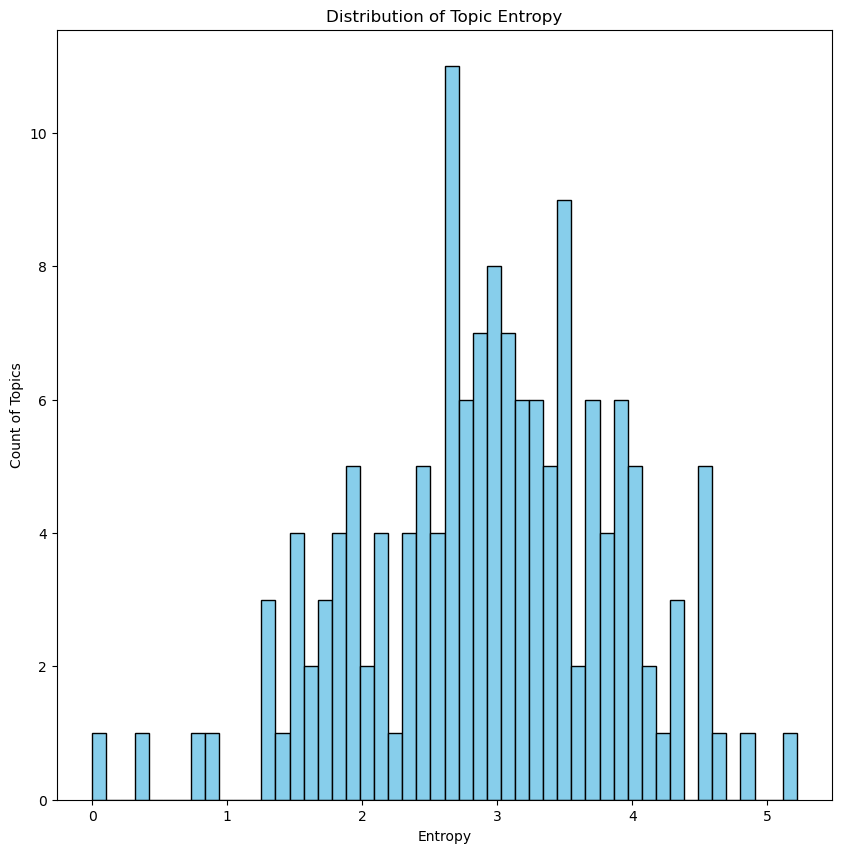

In [24]:
# Create a histogram for the entropy values
plt.figure(figsize=(10, 10))  # Adjust the figure size as needed
plt.hist(topic_entropy['entropy'], bins=50, color='skyblue', edgecolor='black')  # You can adjust the number of bins

plt.xlabel('Entropy')
plt.ylabel('Count of Topics')
plt.title('Distribution of Topic Entropy')

# Show the plot
plt.show()

#### 3.2. Group by year-month

In [14]:
# Step 1: Count the occurrences of each topic in each year_month
topic_month_counts = df.groupby(['Topic', 'year_month']).size().reset_index(name='month_count')

# Step 2: Calculate the total counts of each topic across all year_months
total_month_counts = topic_month_counts.groupby('Topic')['month_count'].sum()

# Step 3: Merge total counts back to the topic-month counts DataFrame
topic_month_counts = topic_month_counts.merge(total_month_counts, on='Topic', suffixes=('', '_total'))

# Step 4: Calculate the probability distribution of each topic over the year_months
topic_month_counts['month_probability'] = topic_month_counts['month_count'] / topic_month_counts['month_count_total']

# Step 5: Calculate the entropy for each topic
topic_month_entropy = topic_month_counts.groupby('Topic')['month_probability'].apply(entropy).reset_index(name='month_entropy')

# Step 6: Create a mapping DataFrame from df
for column in ['Topic', 'Topic Name', 'Topic Representation']:
    if df[column].apply(lambda x: isinstance(x, list)).any():
        df[column] = df[column].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)

topic_mapping = df[['Topic', 'Topic Name', 'Topic Representation']].drop_duplicates()

# Step 7: Merge this mapping with topic_month_entropy
topic_month_entropy = topic_month_entropy.merge(topic_mapping, on='Topic')

In [15]:
topic_month_entropy

,Topic,month_entropy,Topic Name,Topic Representation
0,-1,8.409904,-1_the_of_and_to,"the, of, and, to, in, oil, that, prices, for, on"
1,0,6.717941,0_venezuela_hugo_venezuelan_chavez,"venezuela, hugo, venezuelan, chavez, caracas, ..."
2,1,6.476943,1_russia_russian_russias_soviet,"russia, russian, russias, soviet, vladimir, mo..."
3,2,6.558179,2_billion_d1_company_companies,"billion, d1, company, companies, bid, buy, dea..."
4,3,6.561794,3_energy_us_crisis_imports,"energy, us, crisis, imports, embargo, is, stat..."
...,...,...,...,...
143,142,3.459432,142_trout_futures_bull_manages,"trout, futures, bull, manages, crane, market, ..."
144,143,2.160964,143_fischer_joschka_klein_comrade,"fischer, joschka, klein, comrade, hansjoachim,..."
145,144,3.321928,144_below_yesterday_barrel_mercantile,"below, yesterday, barrel, mercantile, slumped,..."
146,145,2.846439,145_stem_cut_production_consensus,"stem, cut, production, consensus, decline, rec..."


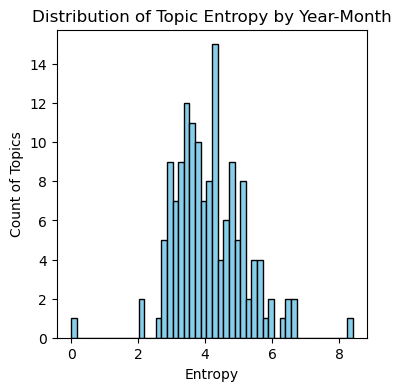

In [23]:
# Create a histogram for the entropy values
plt.figure(figsize=(4, 4))  # Adjust the figure size as needed
plt.hist(topic_month_entropy['month_entropy'], bins=50, color='skyblue', edgecolor='black')  # You can adjust the number of bins

plt.xlabel('Entropy')
plt.ylabel('Count of Topics')
plt.title('Distribution of Topic Entropy by Year-Month')

# Show the plot
plt.show()

### 4. Compute the Cosine similarities between keywords and topics

In [17]:
CosineSimilarityTools = CosineSimilarityTools(topic_model)

In [18]:
df_word = CosineSimilarityTools.get_similarity_dataframe("demand")

In [26]:
df_word

,topic,topic_words,cosine_similarity
0,-1,"the, of, and, to, in, oil, that, prices, for, on",0.459211
1,0,"venezuela, hugo, venezuelan, chavez, caracas, ...",0.307618
2,1,"russia, russian, russias, soviet, vladimir, mo...",0.326238
3,2,"billion, d1, company, companies, bid, buy, dea...",0.528601
4,3,"energy, us, crisis, imports, embargo, is, stat...",0.515954
...,...,...,...
143,142,"trout, futures, bull, manages, crane, market, ...",0.516310
144,143,"fischer, joschka, klein, comrade, hansjoachim,...",0.376462
145,144,"below, yesterday, barrel, mercantile, slumped,...",0.394932
146,145,"stem, cut, production, consensus, decline, rec...",0.464233


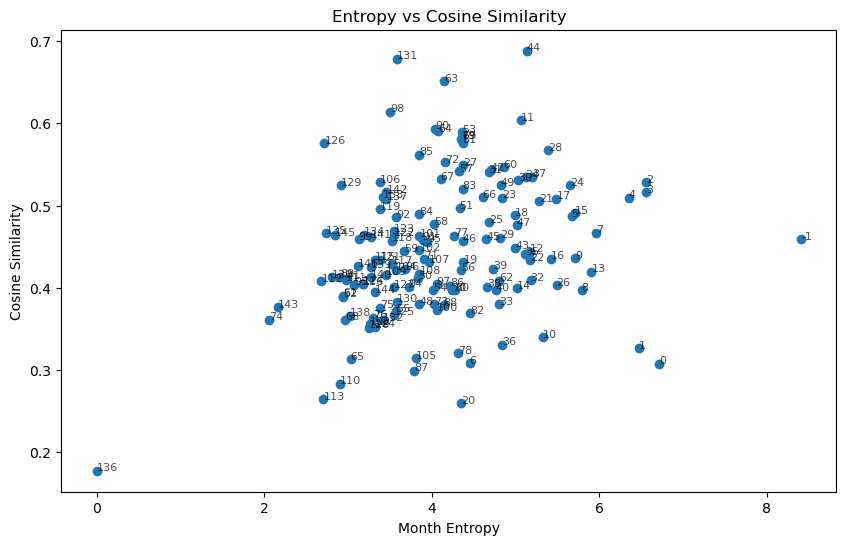

In [20]:
# Assuming merged_df_demand is already created and contains the necessary data
merged_df = pd.merge(df_word, topic_month_entropy, left_on='topic', right_on='Topic')

x = merged_df['month_entropy']
y = merged_df['cosine_similarity']
labels = merged_df['topic']

plt.figure(figsize=(10, 6))
scatter = plt.scatter(x, y)

# Adding labels for each point
for i, label in enumerate(labels):
    plt.annotate(label, (x[i], y[i]), fontsize=8, alpha=0.7)

plt.title('Entropy vs Cosine Similarity')
plt.xlabel('Month Entropy')
plt.ylabel('Cosine Similarity')
plt.show()

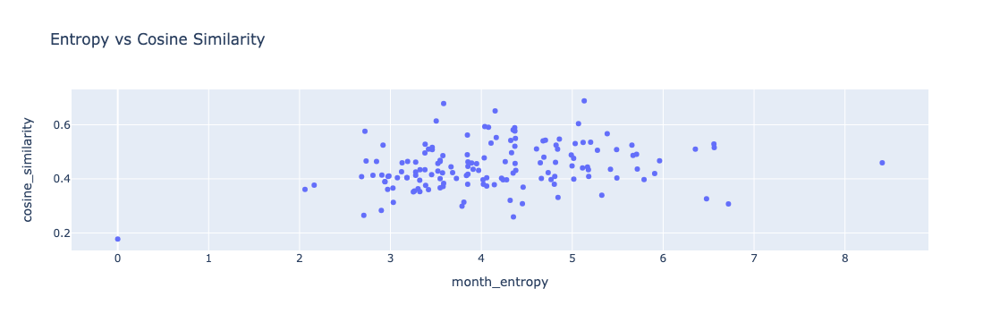

In [28]:
import plotly.express as px

fig = px.scatter(merged_df, x='month_entropy', y='cosine_similarity',
                 hover_data=['topic_words', 'month_entropy', 'cosine_similarity'],
                 title='Entropy vs Cosine Similarity')

# Update hover template to format the display of hover information
fig.update_traces(hovertemplate="<br>".join([
    "Topic Words: %{customdata[0]}",
    "Entropy: %{customdata[1]}",
    "Cosine Similarity: %{customdata[2]}"
]))

fig.show()